## Housekeeping Settings

In [1]:
import numpy as np, pandas as pd, scanpy as sc, anndata as ad, matplotlib.pyplot as plt, os, logging, seaborn as sns, pickle
from scipy.stats import median_abs_deviation, hypergeom
import multiprocessing as mp, celloracle as co

%config InlineBackend.figure_format = 'retina'
%matplotlib inline
plt.rcParams["savefig.dpi"] = 300

wd = '/ocean/projects/cis240075p/skeshari/igvf/bcell2/primaryBCell'
out_path = os.path.join(wd, 'out_data')
os.makedirs(f"{out_path}/figures", exist_ok=True)
os.makedirs(f"{out_path}/intermediate_data", exist_ok=True)
os.makedirs(f"{out_path}/perturbed_data", exist_ok=True)
os.makedirs(f"{out_path}/out_other_methods", exist_ok=True)
os.makedirs(f"{wd}/scripts", exist_ok=True)
sc.settings.figdir = f"{out_path}/figures"

/ocean/projects/cis240075p/skeshari/.conda/envs/celloracle_env/lib/python3.8/site-packages/loompy/bus_file.py:68: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  def twobit_to_dna(twobit: int, size: int) -> str:
/ocean/projects/cis240075p/skeshari/.conda/envs/celloracle_env/lib/python3.8/site-packages/loompy/bus_file.py:85: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for detai

## FUNCTIONS: Scanpy Preprocessing of scRNA
Please edit the functions as required. DO NOT blindly run it.... =) You might want to change certain things to get things going!
Typical steps which are followed in scRNA processing are:
-   Labeling genes which are not required: Mitochondrial, Ribosomal, Hemoglobin
-   Looking for QC of **Cells**: Here specifically we want to remove cells which have extremely high mitochondrial count
-   Filtering **Genes**: Getting rid of the genes which we don't want (Mitochondrial, Ribosomal, Hemoglobin)
-   Normalizing **Gene Counts**: Due to different depth of the cells, we normalize the counts and then lake the log so that the values are in a decent range to be compared
-   Feature Selection: We select top n genes (typically 3k) so that we can run various algorithms downstream. Genes which are specifically of interest should be added back since they might get dropped of due to the "top n genes" filtering
-   Dimentionality Reduction: Not all dimentions (here: genes) are informative. hence run PCA to find the most variable dimension

This is then followed by the downstream analysis: UMAP, Clustering, Cluster Identification, Expression of certain genes in clusters etc.

In [20]:
def label_genes(adata):
    adata.var_names = [gene.upper() for gene in adata.var_names]
    adata.var['mt'] = adata.var_names.str.startswith('MT-')  # mitochondrial genes
    adata.var['linc'] = adata.var_names.str.startswith('LINC') # linc genes
    adata.var["ribo"] = adata.var_names.str.startswith(("RPS", "RPL")) # ribosomal genes
    adata.var["hb"] = adata.var_names.str.contains("^HB[^(P)]") # hemoglobin genes
    return adata

def qc_plots(adata):
    sc.pp.calculate_qc_metrics(adata, qc_vars=["mt", "ribo", "hb"], inplace=True, log1p=True)
    # the number of genes expressed in the count matrix, the total counts per cell, and the percentage of counts in mitochondrial genes
    sc.pl.violin(adata,["n_genes_by_counts", "total_counts", "pct_counts_mt"],jitter=0.4,multi_panel=True, save="_qc_metrics_violin.png")
    sc.pl.scatter(adata, "total_counts", "n_genes_by_counts", color="pct_counts_mt", save="_qc_metrics_scatter.png")
    return adata

def is_outlier(adata, metric: str, nmads: int):
    M = adata.obs[metric]
    outlier = (M < np.median(M) - nmads * median_abs_deviation(M)) | (np.median(M) + nmads * median_abs_deviation(M) < M)
    return outlier

def remove_outliers(adata):
    adata.obs["outlier"] = (is_outlier(adata, "log1p_total_counts", 5) | is_outlier(adata, "log1p_n_genes_by_counts", 5) | is_outlier(adata, "pct_counts_in_top_50_genes", 5))
    adata.obs["mt_outlier"] = is_outlier(adata, "pct_counts_mt", 3) | (adata.obs["pct_counts_mt"] > 8)
    print(f"Total number of cells: {adata.n_obs}")

    adata = adata[(~adata.obs.outlier) & (~adata.obs.mt_outlier)].copy()
    print(f"Number of cells after filtering of low quality cells: {adata.n_obs}")
    sc.pl.scatter(adata, "total_counts", "n_genes_by_counts", color="pct_counts_mt", save="_qc_metrics_scatter_filtered.png")
    return adata

def filter_data(adata):
    sc.pp.filter_cells(adata, min_genes=100)
    sc.pp.filter_genes(adata, min_cells=3)
    adata = adata[:,(~adata.var['mt'])]
    # adata = adata[:,(~adata.var['mt'] & ~adata.var['linc'] & ~adata.var['ribo'] & ~adata.var['hb'])] # Filter mitochondrial, linc, ribosomal, haemoglobin genes
    return adata

def normalize_data(adata):
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))
    sns.histplot(adata.obs["total_counts"], bins=100, kde=False, ax=axes[0])
    axes[0].set_title("total_counts")
    if adata.layers.get("counts") is None:
        adata.layers["counts"] = adata.X.copy() # Saving the actual counts in different layer. often not useful due to variability in sequencing depth and other technical biases.
    sc.pp.normalize_per_cell(adata, key_n_counts='total_counts') # Normalizing gene expression per cell to median total counts
    sc.pp.log1p(adata) # Taking log of the values
    sns.histplot(adata.obs["log1p_total_counts"], bins=100, kde=False, ax=axes[1])
    axes[1].set_title("Shifted logarithm of normalized total_counts")
    adata.raw = adata # store the log normalized data
    plt.savefig(f'{out_path}/figures/total_counts.png')
    return adata

def feature_selection(adata, gene_list = None):
    sc.pp.highly_variable_genes(adata, flavor='cell_ranger',n_top_genes=3000) # Select top 3000 highly-variable genes based on the normalized counts

    if gene_list is not None:
        for gene in adata.var_names:
            try:
                if gene not in gene_list:
                    adata.var['highly_variable'][gene] = False
                else:
                    adata.var['highly_variable'][gene] = True
            except KeyError:
                print(f"{gene} is present in gene list but not in the anndata", flush = True)
                continue
    # Subset the genes
    adata = adata[:, adata.var.highly_variable]
    return adata

def dim_reduction(adata):
    #Scale before running PCA
    sc.pp.regress_out(adata, ["total_counts", "pct_counts_mt"])
    sc.pp.scale(adata, max_value=10)
    sc.tl.pca(adata)
    sc.pl.pca_variance_ratio(adata, n_pcs=20, log=True)
    sc.pp.neighbors(adata)
    return adata

In [21]:
path_to_adata = f'{out_path}/out_other_methods/adata_aggregated_gene.leiden_updated.h5ad'
adata = ad.read_h5ad(path_to_adata)
adata
# Data is already normalized and logged.....Since adata.X is float
# Another way to check np.sum(adata.layers['counts'].toarray(), axis=1) is similar to adata.obs["total_counts"]. Also log(1+x) is similar to adata.X
# Layers attribute has the original counts

AnnData object with n_obs × n_vars = 32418 × 23090
    obs: 'cell_type_major', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'topic_0', 'topic_1', 'topic_2', 'topic_3', 'topic_4', 'topic_5', 'topic_6', 'topic_7', 'topic_8', 'topic_9', 'topic_10', 'topic_11', 'topic_12', 'topic_13', 'topic_14', 'topic_15', 'topic_16', 'topic_17', 'topic_18', 'topic_19', 'topic_20', 'topic_21', 'topic_22', 'topic_23', 'topic_24', 'topic_25', 'topic_26', 'topic_27', 'topic_28', 'topic_29', 'topic_30', 'topic_31', 'leiden', 'score_G1S', 'score_G2M', 'score_myc_up', 'score_GC', 'score_PB', 'score_MBC_1', 'score_MBC_2', 'score_preGC', 'score_LZ_GC', 'score_DZ_GC', 'DNA_damage', 'LZ_vs_DZ_down', 'LZ_vs_DZ_up', 'Ag_presentation', 'BCR_signaling', 'topic7_peak_genes'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'cell_type_major_colors', 'leiden', 'leiden_colors', 'log1p'

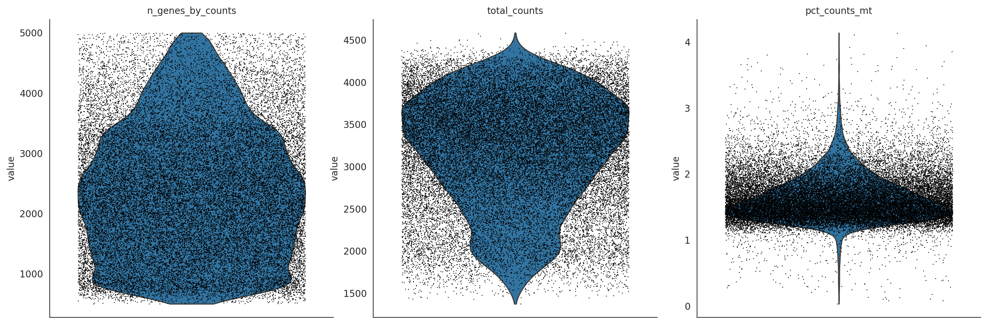

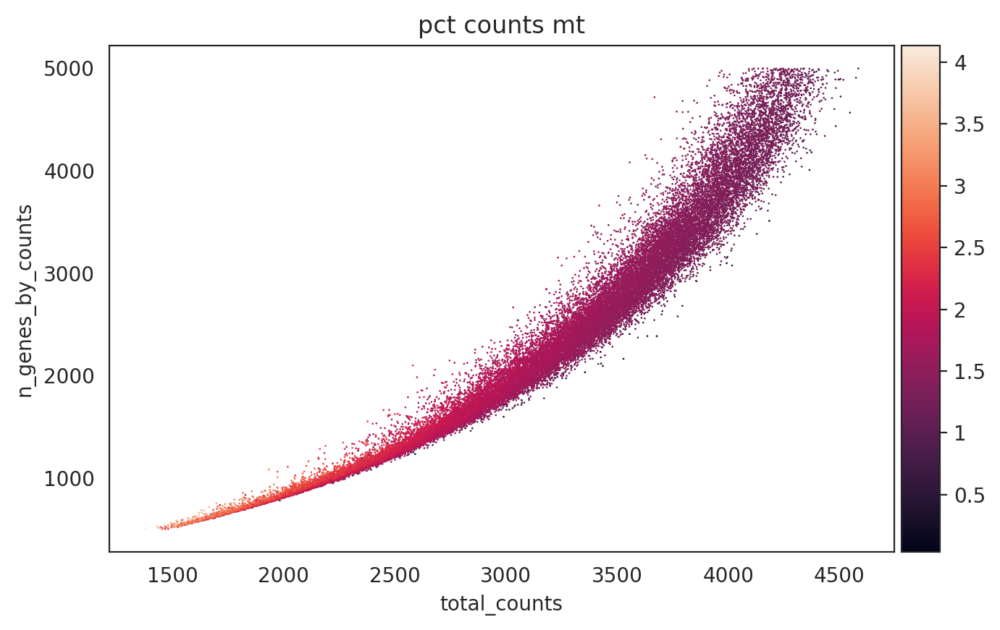

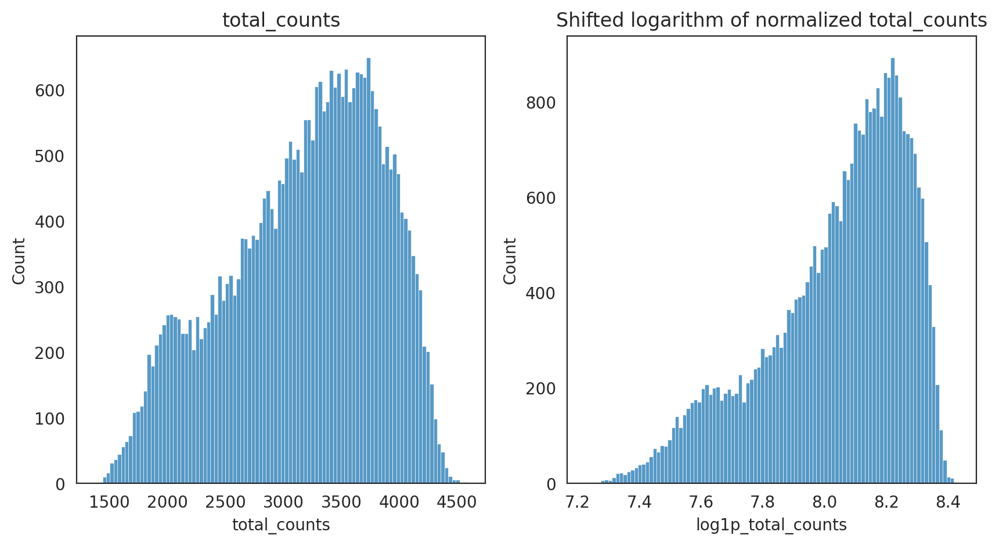

In [22]:
# I am filtering out ribosomal, mitochondrial, linc and hemoglobin genes hence I will again renormalize since the distribution might have changed
# If the distribution did not change, renormalization will not affect the data
adata = label_genes(adata)
adata = qc_plots(adata)
# adata = remove_outliers(adata) No outliers to remove =). Since this is already preprocessed well
adata = filter_data(adata)
adata = normalize_data(adata)

In [23]:
with open(f'{out_path}/out_other_methods/TF_dict_MIRA_95pct.pkl','rb') as f:
    TF_to_TG_dictionary = pickle.load(f)
    
hvf_genes_mira = [tg for values_list in TF_to_TG_dictionary.values() for tg in values_list]

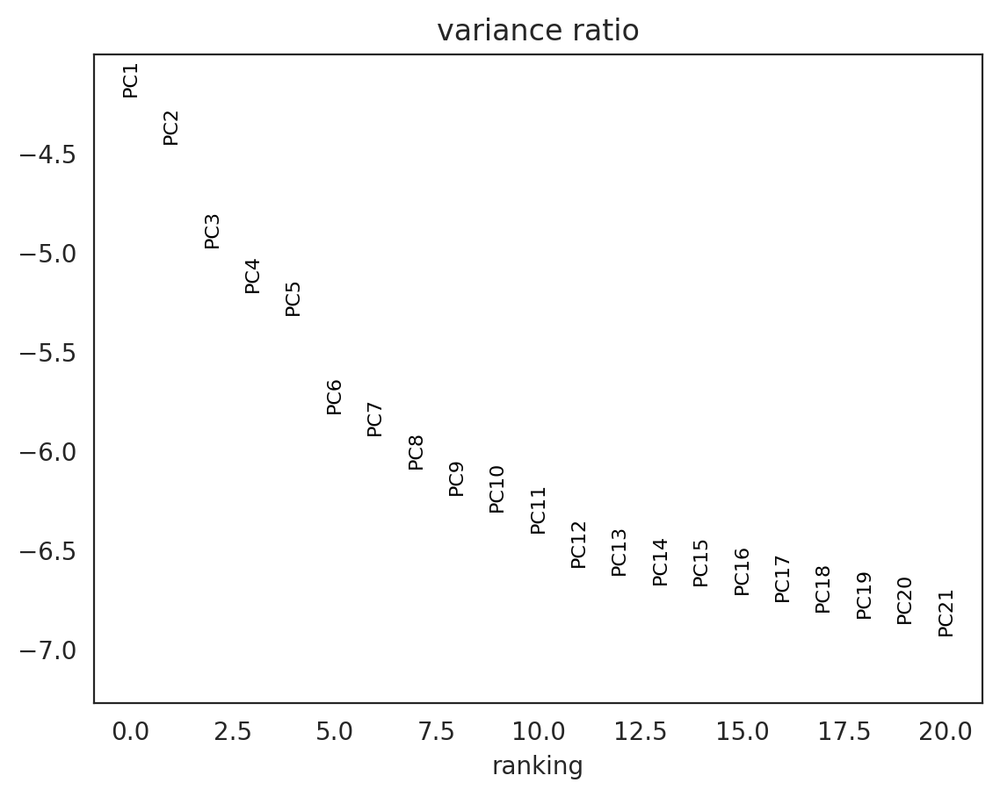

AnnData object with n_obs × n_vars = 32418 × 2568
    obs: 'cell_type_major', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'topic_0', 'topic_1', 'topic_2', 'topic_3', 'topic_4', 'topic_5', 'topic_6', 'topic_7', 'topic_8', 'topic_9', 'topic_10', 'topic_11', 'topic_12', 'topic_13', 'topic_14', 'topic_15', 'topic_16', 'topic_17', 'topic_18', 'topic_19', 'topic_20', 'topic_21', 'topic_22', 'topic_23', 'topic_24', 'topic_25', 'topic_26', 'topic_27', 'topic_28', 'topic_29', 'topic_30', 'topic_31', 'leiden', 'score_G1S', 'score_G2M', 'score_myc_up', 'score_GC', 'score_PB', 'score_MBC_1', 'score_MBC_2', 'score_preGC', 'score_LZ_GC', 'score_DZ_GC', 'DNA_damage', 'LZ_vs_DZ_down', 'LZ_vs_DZ_up', 'Ag_presentation', 'BCR_signaling', 'topic7_peak_genes', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'log1p_total_counts_mt', 'total_counts

In [24]:
marker_list = ["IL10", "AICDA", "IL4R", "FCER2", "IRF8", "BCL6", "IRF8", "JUN", "CD69", "PRDM1", "JCHAIN", "CD27", "CD38", "IRF4", "XBP1", "MZB1", "MKI67"]
TF_perturb_list = ["BATF","BATF3","BCL6","EGR1","FOS","IKZF1","IRF1","IRF4","IRF8","JUNB","JUND","MEF2A","MEF2C","MYB","NFATC1","NTC1","NFATC2","NFIL3","NFKB1","NFKB2","PAX5","PRDM1","RUNX1","SP3","SPI1","STAT1","STAT5A","TCF12","VDR","XBP1","ZBTB7A","SPIB"]
gene_list = list(set(marker_list).union(set(TF_perturb_list)).union(set(hvf_genes_mira)))
adata = feature_selection(adata, gene_list) # Select top 3000 hvg. Adding goi. Scaling at the end.
adata = dim_reduction(adata)
adata

Marker gene of ABC


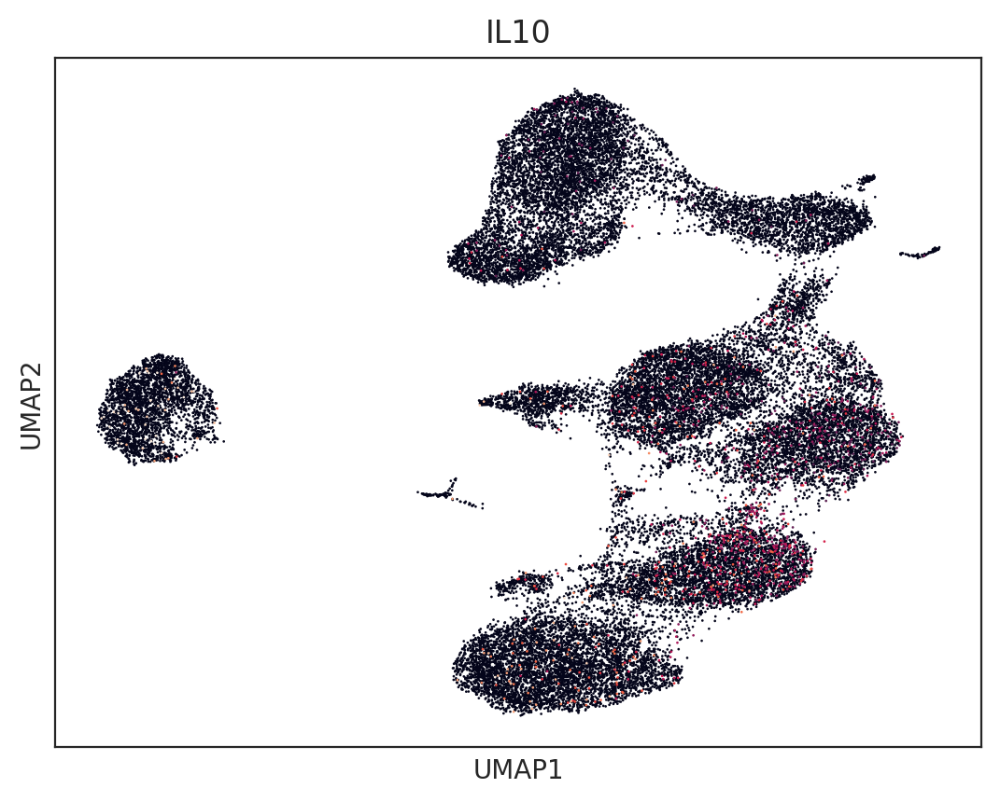

Marker gene of GC


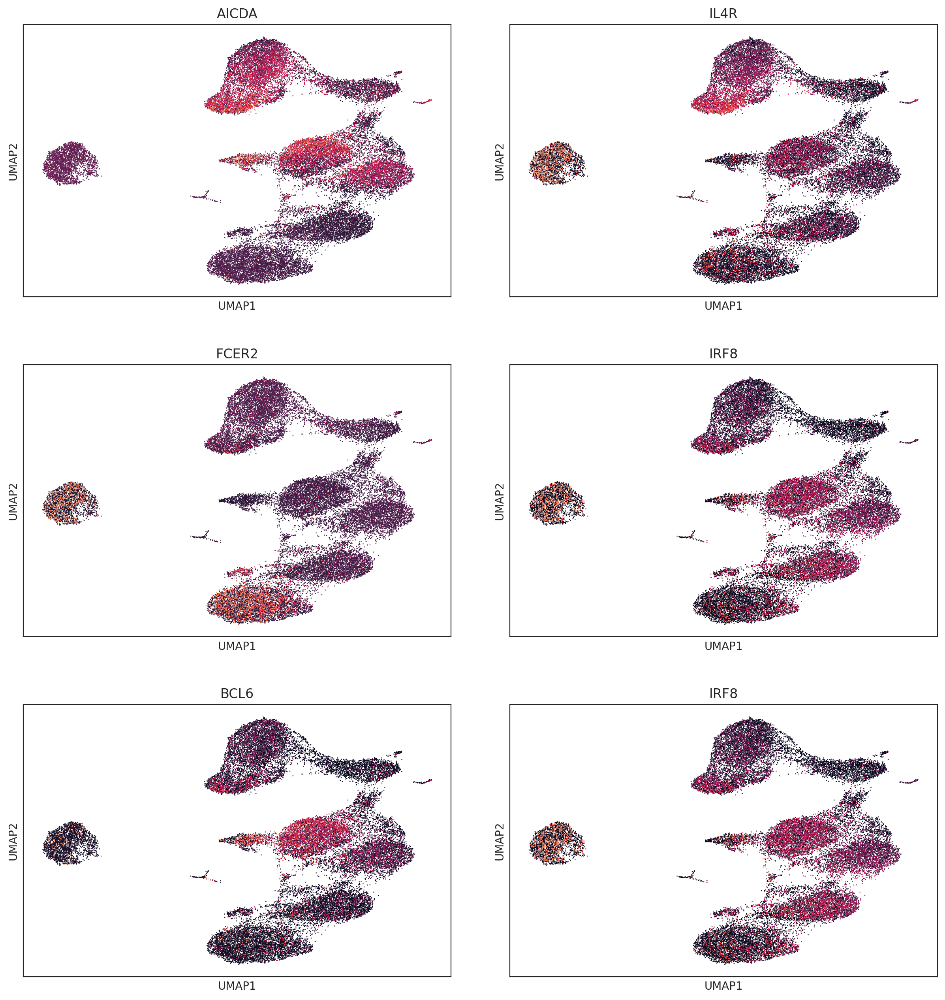

Marker gene of Naive


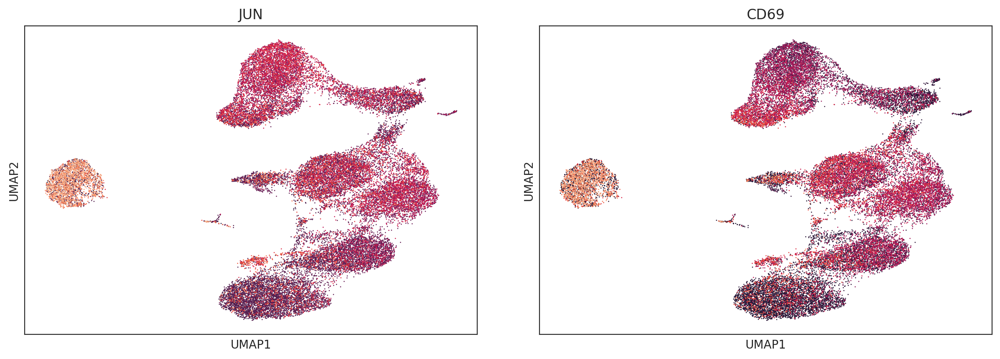

Marker gene of PB


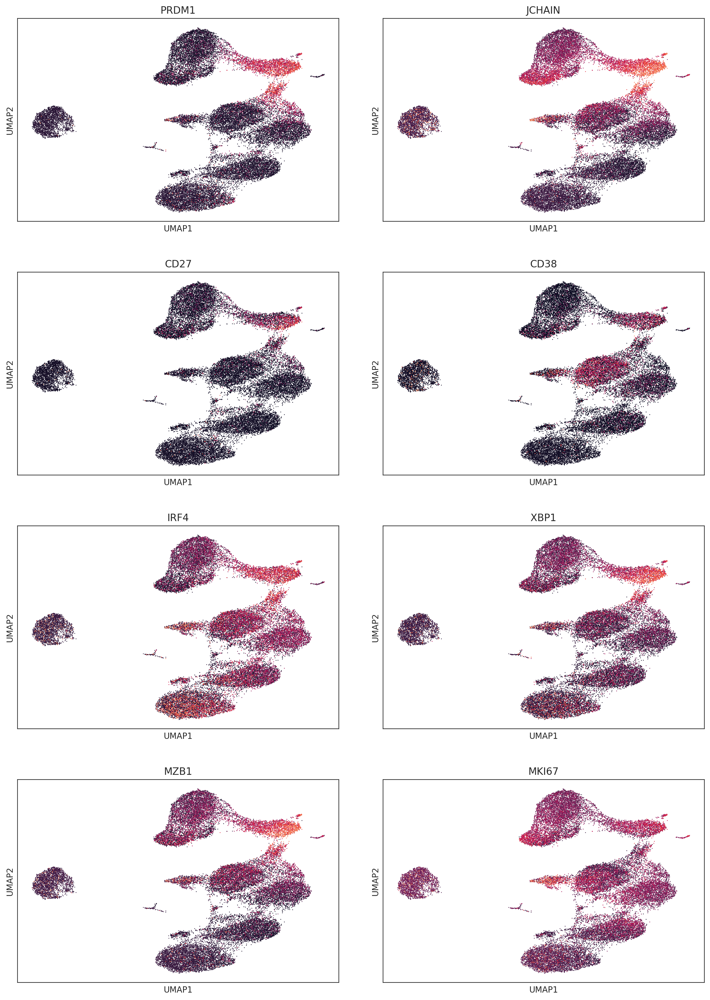

In [25]:
# UMAP is already computed. I will just plot the UMAP
markers = { "ABC":["IL10"],
            "GC":["AICDA","IL4R", "FCER2","IRF8","BCL6","IRF8"],
            "Naive":["JUN", "CD69"],
            "PB":["PRDM1","JCHAIN","CD27","CD38","IRF4","XBP1","MZB1","MKI67"],
            }
for cell_type, genes in markers.items():
    print(f"Marker gene of {cell_type}")
    sc.pl.umap(adata, color=genes, use_raw=False, ncols=2,colorbar_loc=None,save=f'_{cell_type}_expression.png')

... storing 'cell_type' as categorical
... storing 'sub_cell_type' as categorical


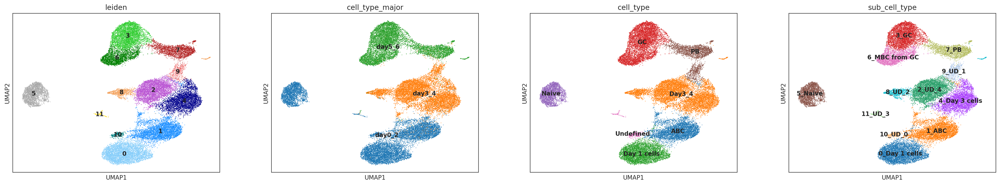

In [27]:
cluster_list = list(set(adata.obs.leiden))
# Annotation 1
annotation = {"Naive":[5],
              "PB":[7,9],  
              "ABC":[1],
              "Day 1 cells" :[0],   
              "Undefined":[10,11],
              "GC":[3,6],
              "Day3_4":[2,4,8]}

# Change dictionary format for annotation assignment
anno_reverse = {}
for i in cluster_list:
    for k in annotation:
        if int(i) in annotation[k]:
            anno_reverse[i] = k
adata.obs["cell_type"] = [anno_reverse[i] for i in adata.obs.leiden]

# Annotation 2
annotation_2 = {'5': '5_Naive',
                '10': '10_UD_0',
                '9': '9_UD_1',
                '8': '8_UD_2',
                '3': '3_GC',
                '11': '11_UD_3',
                '1': '1_ABC',
                '0': '0_Day 1 cells',
                '7': '7_PB',
                '4': '4_Day 3 cells',
                '6': '6_MBC from GC',
                '2': '2_UD_4'}
adata.obs["sub_cell_type"] = [annotation_2[i] for i in adata.obs.leiden]
sc.pl.umap(adata, color=['leiden','cell_type_major','cell_type','sub_cell_type'],legend_loc='on data',save='_cell_type_annotation.pdf')

In [28]:
adata.write(f'{out_path}/intermediate_data/sc_processed.h5ad')
# adata = ad.read_h5ad(os.path.join(wd, '../out_data/intermediate_data', 'sc_processed.h5ad'))

## Reading the adata with scRNA and base GRN for ATAC part

In [29]:
n_cells_downsample = 30000 # Random downsampling into 30K cells if the anndata object include more than 30 K cells.
if adata.shape[0] > n_cells_downsample:
    sc.pp.subsample(adata, n_obs=n_cells_downsample, random_state=123) # Downsample into 30K cells

In [30]:
cicero_GRN=pd.read_csv(f'{out_path}/out_other_methods/base_GRN_dataframe.csv')
cicero_GRN = cicero_GRN[cicero_GRN['gene_short_name'].isin(hvf_genes_mira)].drop(columns=['peak_id']).groupby('gene_short_name').count().sort_values(by='gene_short_name',ascending=False)
TF_to_TG_dictionary.update({col: cicero_GRN.index[cicero_GRN[col] != 0].tolist() for col in cicero_GRN.columns if col not in TF_to_TG_dictionary.keys()})
with open(f'{out_path}/intermediate_data/TF_to_TG_dictionary.pkl','wb') as f:
    pickle.dump(TF_to_TG_dictionary, f)

In [34]:
import matplotlib.colors as mcolors
hex_codes = [mcolors.CSS4_COLORS[color] for color in adata.uns['leiden_colors']]# Convert color names to hex codes
adata.uns['leiden_colors'] = hex_codes

In [35]:
oracle = co.Oracle() # Instantiate Oracle object
adata.X = (adata.layers["counts"]).copy() # In this notebook, we use the unscaled mRNA count for the Input of Oracle object.
oracle.import_anndata_as_raw_count(adata=adata, cluster_column_name="leiden", embedding_name="X_umap") # assigning scRNA (adata) to oracle object
TG_to_TF_dictionary = co.utility.inverse_dictionary(TF_to_TG_dictionary)
oracle.addTFinfo_dictionary(TG_to_TF_dictionary)
# oracle.import_TF_data(TF_info_matrix=base_GRN) # assigning scATAC (baseGRN) to oracle object

  0%|          | 0/2552 [00:00<?, ?it/s]

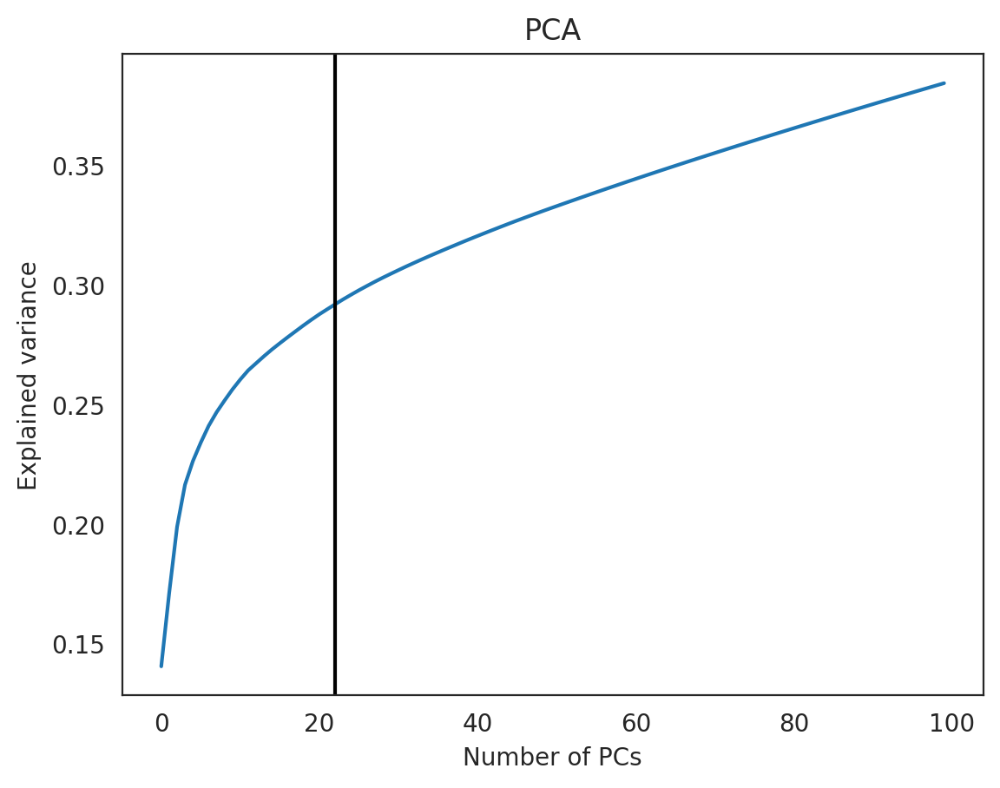

Optimal numbers of PCA dimensions are found to be : 22
Number of cell in the data are :30000
Auto-selected k is :750


In [36]:
## CellOracle uses the same strategy as velocyto for visualizing cell transitions. This process requires KNN imputation in advance.
# For the KNN imputation, we first need to calculate and select PCs. Perform PCA
oracle.perform_PCA()
# Select important PCs
plt.plot(np.cumsum(oracle.pca.explained_variance_ratio_)[:100])
n_comps = np.where(np.diff(np.diff(np.cumsum(oracle.pca.explained_variance_ratio_))>0.002))[0][0]
plt.axvline(n_comps, c="k");plt.xlabel("Number of PCs");plt.ylabel("Explained variance");plt.title("PCA");plt.show()
print("Optimal numbers of PCA dimensions are found to be :",n_comps)
n_comps = min(n_comps, 50) ## Ceiling the number of PCs to 50

## Performing KNN imputation
n_cell = oracle.adata.shape[0]
print(f"Number of cell in the data are :{n_cell}")
k = int(0.025*n_cell)
print(f"Auto-selected k is :{k}")
oracle.knn_imputation(n_pca_dims=n_comps, k=k, balanced=True, b_sight=k*8, b_maxl=k*4, n_jobs=4)
## Save cellOracle data
oracle.to_hdf5(f'{out_path}/intermediate_data/primaryBdata.celloracle.oracle')

# Following steps take time. Consider running batch script

In [42]:
import subprocess, os
job_name = '03'
def shell_script_header_cpu(save_path, job_name):
    sbatch_script_header_cpu = f"""#!/bin/bash
#SBATCH --job-name="{job_name}"
#SBATCH --output="{save_path}/scripts/{job_name}.log"
#SBATCH -p RM-shared
#SBATCH -N 1
#SBATCH --ntasks-per-node=32
#SBATCH -t 0-01:30:00

module load anaconda3/2022.10
source activate celloracle_env

"""
    return sbatch_script_header_cpu

with open(f'{wd}/scripts/{job_name}.sh', "w", encoding="utf-8") as f:
    f.write(shell_script_header_cpu(save_path = wd, job_name = job_name))
    f.write(f"python {wd}/scripts/03_scanpy_preprocessing.py")

subprocess.run(["sbatch", f'{wd}/scripts/{job_name}.sh'])
print(f"Submitted {job_name}.sh")

Submitted batch job 25647923
Submitted 03.sh


In [17]:
links = oracle.get_links(cluster_name_for_GRN_unit="leiden", alpha=10, verbose_level=10)

  0%|          | 0/12 [00:00<?, ?it/s]

Inferring GRN for 0...


  0%|          | 0/2552 [00:00<?, ?it/s]

Inferring GRN for 1...


  0%|          | 0/2552 [00:00<?, ?it/s]

Inferring GRN for 10...


  0%|          | 0/2552 [00:00<?, ?it/s]

Inferring GRN for 11...


  0%|          | 0/2552 [00:00<?, ?it/s]

Inferring GRN for 2...


  0%|          | 0/2552 [00:00<?, ?it/s]

Inferring GRN for 3...


  0%|          | 0/2552 [00:00<?, ?it/s]

Inferring GRN for 4...


  0%|          | 0/2552 [00:00<?, ?it/s]

Inferring GRN for 5...


  0%|          | 0/2552 [00:00<?, ?it/s]

Inferring GRN for 6...


  0%|          | 0/2552 [00:00<?, ?it/s]

Inferring GRN for 7...


  0%|          | 0/2552 [00:00<?, ?it/s]

Inferring GRN for 8...


  0%|          | 0/2552 [00:00<?, ?it/s]

Inferring GRN for 9...


  0%|          | 0/2552 [00:00<?, ?it/s]

# Refitting on top 10k significant in each cluster

In [18]:
# Calculate GRN for each population in clustering unit.
links.filter_links() # Getting back to default thresholds (p<0.001 and top 10k) for simulation of GRN -- so that we have enough edges to simulate the GRN
oracle.get_cluster_specific_TFdict_from_Links(links_object=links) #### Runs another round on links.filtered_links to get final links
oracle.fit_GRN_for_simulation(alpha=10, use_cluster_specific_TFdict=True)
# Saving for KO simulation.
oracle.to_hdf5(f'{out_path}/intermediate_data/oracle_fitted.celloracle.oracle')

  0%|          | 0/12 [00:00<?, ?it/s]

# For Network Analysis creating and saving final network!

In [19]:
links_after_fit = co.Links(name="links_after_fit")
links_after_fit.links_dict = links.links_dict #### Saving (GRN 1 simulation) completely
links_after_fit.filtered_links = links.filtered_links #### Just for initialization

for cluster in links.filtered_links.keys():
    cluster_specific_links = oracle.coef_matrix_per_cluster[cluster].stack().reset_index()
    cluster_specific_links.columns = ['source', 'target', 'coef_mean']
    cluster_specific_links = cluster_specific_links[cluster_specific_links ['coef_mean'] != 0].reset_index(drop=True)
    cluster_specific_links['coef_abs'] = np.abs(cluster_specific_links['coef_mean'])
    cluster_specific_links.to_csv(f'{out_path}/intermediate_data/cluster_{cluster}.csv', index=False)
    links_after_fit.filtered_links[cluster] = cluster_specific_links

links_after_fit.get_network_score()
links_after_fit.merged_score.to_csv(f'{out_path}/intermediate_data/network_analysis_scores.csv')
links.to_hdf5(f'{out_path}/intermediate_data/oracle_fitted.celloracle.links')

In [ ]:
# For network scores filter to the top 2000 edges and only significant edges...because they most likely will be in the network
# Remove uncertain network edges based on the p-value.
# Remove weak network edge. In this tutorial, we keep the top 2000 edges ranked by edge strength.
# The raw network data is stored in the `links_dict` attribute, while the filtered network data is stored in the `filtered_links` attribute. 
# links.filter_links(p=0.001, weight="coef_abs", threshold_number=2000)
# links.get_network_score()
# links.to_hdf5(os.path.join(wd, '../out_data/intermediate_data', "network_analysis.celloracle.links"))
# links.merged_score.to_csv(os.path.join(wd, '../out_data/intermediate_data', "network_analysis_scores.csv"))
# color_dict = {str(k): v for k, v in zip(set(oracle.adata.obs['leiden'].astype(int)), ['lightskyblue', 'dodgerblue', 'mediumorchid', 'limegreen', 'darkblue', 'darkgray', 'green', 'firebrick', 'sandybrown', 'lightcoral', 'teal', 'gold'])}
# oracle.colorandum = np.array([color_dict[i] for i in oracle.adata.obs['leiden']])    

In [2]:
oracle = co.load_hdf5(f'{out_path}/intermediate_data/oracle_fitted.celloracle.oracle')
links = co.load_hdf5(f'{out_path}/intermediate_data/oracle_fitted.celloracle.links')

# Perturbation Experiment

## Do Perturbation

In [ ]:
# oracle = co.load_hdf5("../out_data/files/oracle_fitted.celloracle.oracle")
def ko_simulation(oracle,goi, cluster_column_name="cell_type"):
    try:
        # Enter perturbation conditions to simulate signal propagation after the perturbation.
        print(f"Simulating perturbation for {goi}")
        oracle.simulate_shift(perturb_condition={goi: 0.0},n_propagation=2) # If kernal crashes increase the memory limit of jupyter notebook
        print(f"Estimating transition probability for {goi}")
        oracle.estimate_transition_prob(n_neighbors=200, knn_random=True, sampled_fraction=1) # Get transition probability
        print(f"Calculating embedding for {goi}")
        oracle.calculate_embedding_shift(sigma_corr=0.05) # Calculate embedding
        print(f'Saving perturbed data for {goi}')
        oracle.to_hdf5(f'{out_path}/{goi}_perturbation.celloracle.oracle')
    except Exception as e:
        print(f'Process {mp.current_process().name} failed for gene {goi} with error {e}', flush=True)
    return None

# ko_simulation(oracle, "BCL6")
with mp.Pool(processes=2) as pool:
    tf_of_interest = ["BATF", "IRF4", "IRF8", "PRDM1", "SPIB"]
    tasks = [pool.apply_async(ko_simulation, args=(oracle, tf)) for tf in tf_of_interest]
    for task in tasks:
        try:
            result = task.get()  # Specify timeout according to needs
            print(f"Task completed: {task}")
        except Exception as e:
            print(f"Task failed: {e}")

## Analyze perturbation

In [ ]:
# sum(oracle.coef_matrix_per_cluster['0'].sum()!=0) # Final fit of GRN after bayesian ridge regression. All of them are significant =)
# sum(sum(oracle.adata.layers['simulated_count'] == oracle.adata.layers['imputed_count'])!=30000) #no of cells perturbed
# oracle.extract_active_gene_lists(return_as='indivisual_dict') #len of genes in each cluster
# len(oracle.all_regulatory_genes_in_TFdict) # TF in oracle
# len(oracle.all_target_genes_in_TFdict) # genes in oracle
# oracle.transition_prob.sum(axis=1) # transition probability of cell to go to other cell: 

## Frequency enrichment of cells

In [ ]:
def perturb_in_out(goi):
    result = {goi: []}
    print(f"Calculating ratio for {goi}", flush=True)
    oracle = co.load_hdf5(os.path.join(wd, '../out_data/intermediate_data', f"{goi}_perturbation.celloracle.oracle"))

    # Plotting the perturbation graph
    n_grid = 40; min_mass = 0.04
    oracle.calculate_p_mass(smooth=0.8, n_grid=n_grid, n_neighbors=200)
    oracle.calculate_mass_filter(min_mass=min_mass, plot=True)

    fig, ax = plt.subplots(figsize=[8, 8])
    scale_simulation = 15
    oracle.plot_cluster_whole(ax=ax, s=10)
    oracle.plot_simulation_flow_on_grid(scale=scale_simulation, ax=ax, show_background=False)
    plt.title(f"{goi} KO simulation")
    plt.savefig(f'{out_path}/figures/{goi}_KO_simulation.svg', dpi=600, format="svg")
    plt.close()

    fig, ax = plt.subplots(figsize=[8, 8])
    scale_simulation = 15
    oracle.plot_cluster_whole(ax=ax, s=10)
    oracle.plot_simulation_flow_random_on_grid(scale=scale_simulation, ax=ax, show_background=False)
    plt.title(f"{goi} KO random simulation")
    plt.savefig(f'{out_path}/figures/{goi}_KO_random_simulation.svg', dpi=600, format="svg")
    plt.close()

    # Defining the type of TF which a TF is
    gc_mean = np.mean(oracle.adata.X[(oracle.adata.obs['cell_type'] == 'GC'),(oracle.adata.var_names == goi)].A)
    pb_mean = np.mean(oracle.adata.X[(oracle.adata.obs['cell_type'] == 'PB'),(oracle.adata.var_names == goi)].A)
    if gc_mean > pb_mean:
        TF_type = 'GC'
    else:
        TF_type = 'PB'
    
    totalGC_counts = oracle.adata.obs[(oracle.adata.obs['cell_type'] == 'GC')].shape[0]
    totalPB_counts = oracle.adata.obs[(oracle.adata.obs['cell_type'] == 'PB')].shape[0]
    total34_counts = oracle.adata.obs[(oracle.adata.obs['cell_type'] == 'Day3_4')].shape[0]

    transition_matrix = oracle.transition_prob
    # transition_matrix = oracle.transition_prob - (oracle.embedding_knn.A/ oracle.embedding_knn.sum(1).A.T)
    transition_matrix = abs(transition_matrix[oracle.adata.obs['cell_type'].isin(['GC', 'PB', 'Day3_4']),:])
    row_labels = oracle.adata.obs[oracle.adata.obs['cell_type'].isin(['GC', 'PB', 'Day3_4'])]['cell_type'].values
    col_labels = oracle.adata.obs['cell_type'].values
    tm_df = pd.DataFrame(transition_matrix, index=row_labels, columns=col_labels)

    # Cell transition is based on Max probability
    max_prob = tm_df.idxmax(axis=1).reset_index()
    max_prob = max_prob[max_prob['index']!=max_prob[0]].groupby('index').agg(lambda x: x.value_counts().to_dict())
    gc_in = 0
    try:
        gc_in += max_prob.loc['Day3_4'][0]['GC']
    except KeyError:
        pass
    
    try:
        gc_in += max_prob.loc['PB'][0]['GC']
    except KeyError:
        pass

    pb_in = 0
    try:
        pb_in += max_prob.loc['Day3_4'][0]['PB']
    except KeyError:
        pass

    try:
        pb_in += max_prob.loc['GC'][0]['PB']
    except KeyError:
        pass
    
    try:
        gc_out = 0 + sum(list(max_prob.loc['GC'][0].values()))
    except KeyError:
        gc_out = 0
    
    try:
        pb_out = 0 + sum(list(max_prob.loc['PB'][0].values()))
    except KeyError:
        pb_out = 0

    finalGC_counts = totalGC_counts - gc_out + gc_in
    finalPB_counts = totalPB_counts - pb_out + pb_in
    result[goi] = [TF_type, totalGC_counts, totalPB_counts, total34_counts, finalGC_counts, finalPB_counts,gc_in, pb_in, gc_out, pb_out]
    return result

In [ ]:
with open(os.path.join(wd, '../out_data/intermediate_data', 'ratio_enrichment.pkl'),'rb') as f:
    ratio = pickle.load(f)
combined_dict = {}
for d in ratio:
    combined_dict.update(d)

x,y = [],[]
colors=[]
for tf in combined_dict.keys():
    x.append(tf)
    # y.append(np.log2(((combined_dict[tf][1]-combined_dict[tf][i+3])/(combined_dict[tf][2]-combined_dict[tf][i+4]))/(combined_dict[tf][1]/combined_dict[tf][2])))
    y.append(np.log2(((combined_dict[tf][4]/combined_dict[tf][5])/(combined_dict[tf][1]/combined_dict[tf][2]))))
    colors.append('r' if combined_dict[tf][0] == 'GC' else 'b')
    pd.DataFrame({'TF':x, 'Ratio':y}).to_csv(os.path.join(wd, '../out_data/perturbed_data', f'ratio_enrichment_model.csv'))

plt.figure(figsize=(20,5))
plt.title('Enrichment Ratios')
sns.barplot(x=x, y=y, palette=colors)
plt.hlines(y=0.01, xmin=0, xmax=len(x)-1, colors='k', linestyles='dashed')
plt.hlines(y=0.00, xmin=0, xmax=len(x)-1, colors='k')
plt.hlines(y=-0.01, xmin=0, xmax=len(x)-1, colors='k', linestyles='dashed')
plt.ylabel('Final Ratio (GC/PB)/Initial Ratio(GC/PB)')
plt.savefig(os.path.join(wd, '../out_data/perturbed_data', f'ratio_enrichment_model.png'))

# SLIDE TF Enrichment

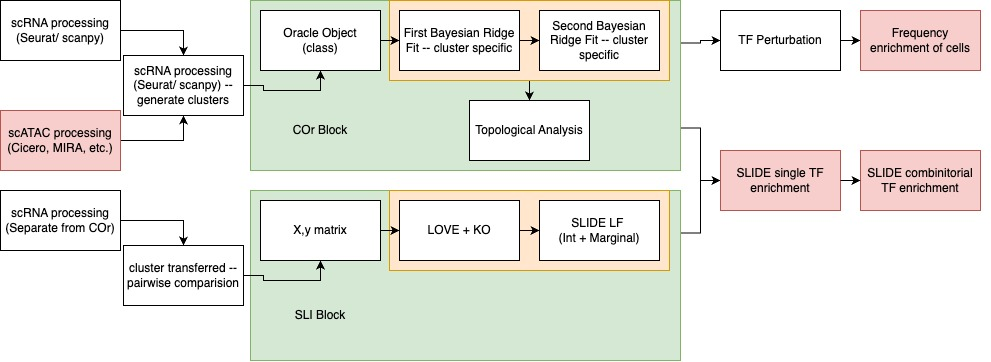

In [3]:
def lf_gene_list(CO_TFs, list_of_paths_to_lfs):
    LF_genes=[]
    for path in list_of_paths_to_lfs:
        if type(path) == str:
            LF_genes=LF_genes+list(pd.read_csv(path,sep='\t')['names'])
    slide_TFs = set(LF_genes).intersection(CO_TFs)
    slide_genes = set(LF_genes).difference(CO_TFs)
    return slide_TFs,slide_genes

In [4]:
CO_TFs = []
for cluster in links.filtered_links.keys():
    links.filtered_links[cluster]['weight'] = links.filtered_links[cluster]['coef_abs'] * links.filtered_links[cluster]['-logp']
    CO_TFs = CO_TFs + list(links.filtered_links[cluster].source.unique())

CO_TFs = set(CO_TFs)
list_of_LFs = pd.read_csv(f"{wd}/out_data/out_other_methods/LFs.txt",sep='\t')
slide_sa_TFs,slide_sa_genes = lf_gene_list(CO_TFs, list(list_of_LFs['Sig_LFs']))
slide_int_TFs,slide_int_genes = lf_gene_list(CO_TFs, list(list_of_LFs['Interacting_LFs']))
slide_TF = list(slide_sa_TFs.union(slide_int_TFs))
slide_genes = list(slide_sa_genes.union(slide_int_genes))

In [66]:
import itertools, networkx as nx, math
clstr_fr_pairwise_comp = ['3','7']
if clstr_fr_pairwise_comp is None:
    clstr_fr_pairwise_comp = list(links.filtered_links.keys())
cluster_pairs = list(itertools.combinations(clstr_fr_pairwise_comp, 2))

min_weight_threshold = 0.5

def classify_weights(weights, threshold):
    strong = 0
    weak = 0
    for weight in weights:
        if weight > threshold:
            strong += 1
        else:
            weak += 1
    return [weak, strong]

def enrichment(M,n,N,X):
    # M is the total number of items in the population ===> Total starting genes in SLIDE
    # n is the number of successes in the population ===> Downstream genes
    # N is the sample size ===> Total SLIDE genes in LF
    # X is the number of successes in the sample.
    p_value = 1 - hypergeom.cdf(X-1, M, n, N)   # Compute the p-value for observing X or more successes
    score = math.log2((X/n)/(N/M))
    return (score, p_value)

cc_dict = {}
M = 6700
for cluster_pair in cluster_pairs:
    # Set up saving dictionary
    cc_dict[cluster_pair] = {'single':[], 'double':[]}
    combined_links = pd.concat([links.filtered_links[cluster_pair[0]], links.filtered_links[cluster_pair[1]]]).sort_values(by='weight', ascending=False)
    
    # Creating the network
    combined_links['sorted_source'] = combined_links[['source', 'target']].min(axis=1)
    combined_links['sorted_target'] = combined_links[['source', 'target']].max(axis=1)
    # Classifying the weights
    grouped_df = combined_links.groupby(['sorted_source', 'sorted_target'])['weight'].apply(lambda x: classify_weights(x, min_weight_threshold)).reset_index()
    clst_pair_graph = nx.from_pandas_edgelist(grouped_df, source='sorted_source', target='sorted_target',edge_attr='weight').to_undirected()
    # Integrating SLIDE
    slide_genes_TF = list(combined_links[combined_links['target'].isin(slide_genes)]['source'].unique())
    total_source = set(slide_TF).union(set(slide_genes_TF))
    total_target = set(slide_TF).union(set(slide_genes))

    # Single TF
    TF_permut = list(itertools.combinations(total_TF, 1))
    for TF1 in TF_permut:
        TF1 = TF1[0]
        if TF1 in clst_pair_graph.nodes:
            conditions_of_interest = list(itertools.product([1],[1])) # Single TF
            for condition in conditions_of_interest:
                common, dwngene = 0, 0
                cmn_list, dwn_list = [], []
                for target in set(clst_pair_graph[TF1].keys()):
                    if  (clst_pair_graph[TF1][target].get('weight', None)[condition[0]]) > 0:
                        if target in total_target:
                            common+=1; dwngene+=1
                            cmn_list.append(target); dwn_list.append(target)
                        else:
                            dwngene+=1; dwn_list.append(target)
                if dwngene==0 or common==0:
                    cc_dict[cluster_pair]['single'].append([(TF1), (condition), (0,1), (cmn_list, dwn_list)])
                else:
                    cc_dict[cluster_pair]['single'].append([(TF1), (condition), enrichment(M,dwngene,len(total_target),common), (cmn_list, dwn_list)])

    # Combinitorial TF
    TF_permut = list(itertools.combinations(total_TF, 2))
    for TF1, TF2 in TF_permut:
        if (TF1 in clst_pair_graph.nodes) and (TF2 in clst_pair_graph.nodes):
            conditions_of_interest = list(itertools.product([0,1],[0,1])) # Combinitorial TF
            for condition in conditions_of_interest:
                common, dwngene = 0, 0
                for target in set(clst_pair_graph[TF1].keys()).intersection(clst_pair_graph[TF2].keys()):
                    if  (clst_pair_graph[TF1][target].get('weight', None)[condition[0]] > 0) and \
                        (clst_pair_graph[TF2][target].get('weight', None)[condition[1]] > 0):
                        if target in total_target:
                            common+=1; dwngene+=1
                            cmn_list.append(target); dwn_list.append(target)
                        else:
                            dwngene+=1; dwn_list.append(target)
                if dwngene==0 or common==0:
                    cc_dict[cluster_pair]['double'].append([(TF1,TF2), (condition), (0,1), (cmn_list, dwn_list)])
                else:
                    cc_dict[cluster_pair]['double'].append([(TF1,TF2), (condition), enrichment(M,dwngene,len(total_target),common), (cmn_list, dwn_list)])
